In [1]:
from torch.utils.data import DataLoader
import torchvision.transforms as T
from custom_dataset import YoloToFRCNNDataset
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from faster_rcnn import FasterRCNN
import torch
from extract_results import load_model_and_store_data_in_csv

c:\Users\Ciro\Anaconda3\envs\nlp\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
transforms = T.Compose([
    T.ToTensor()
])

# Datasets
train_ds = YoloToFRCNNDataset("../yolo_t_grayscale/images/train", "../yolo_t_grayscale/labels/train", transforms)
val_ds   = YoloToFRCNNDataset("../yolo_t_grayscale/images/val", "../yolo_t_grayscale/labels/val", transforms)

# Loaders
def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_ds, batch_size=2, shuffle=False, collate_fn=collate_fn)

# Modelo preentrenado
model = fasterrcnn_resnet50_fpn(pretrained=True)
classes = ['cow','deer','horse']
fast_rcnn = FasterRCNN(model,classes)

c:\Users\Ciro\Anaconda3\envs\nlp\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ciro\Anaconda3\envs\nlp\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
fast_rcnn.train(train_loader,num_epochs=50)

Epoch 1 - Loss: 0.6051
Epoch 11 - Loss: 0.1283
Epoch 21 - Loss: 0.0904
Epoch 31 - Loss: 0.0576
Epoch 41 - Loss: 0.0219


In [3]:
test_ds = YoloToFRCNNDataset("../yolo_t_grayscale/images/test", "../yolo_t_grayscale/labels/test", transforms)
test_loader = DataLoader(test_ds, batch_size=4, shuffle=False, collate_fn=collate_fn)
results = fast_rcnn.predict(test_loader)

In [5]:
print(results)

{'map': tensor(0.5458), 'map_50': tensor(0.9248), 'map_75': tensor(0.5861), 'map_small': tensor(-1.), 'map_medium': tensor(0.4663), 'map_large': tensor(0.6705), 'mar_1': tensor(0.2386), 'mar_10': tensor(0.5975), 'mar_100': tensor(0.5975), 'mar_small': tensor(-1.), 'mar_medium': tensor(0.5132), 'mar_large': tensor(0.6957), 'map_per_class': tensor(-1.), 'mar_100_per_class': tensor(-1.), 'classes': tensor([1, 2, 3], dtype=torch.int32)}


In [8]:
torch.save(fast_rcnn.model.state_dict(), "models/fasterrcnn_t_grayscale.pth")

In [4]:
load_model_and_store_data_in_csv("fasterrcnn_t_grayscale","models/fasterrcnn_t_grayscale.pth",test_loader,test_ds)

c:\Users\Ciro\Anaconda3\envs\nlp\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


c:\Users\Ciro\Anaconda3\envs\nlp\lib\site-packages\torchvision\utils.py:233: UserWarning: Argument 'font_size' will be ignored since 'font' is not set.
  warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")


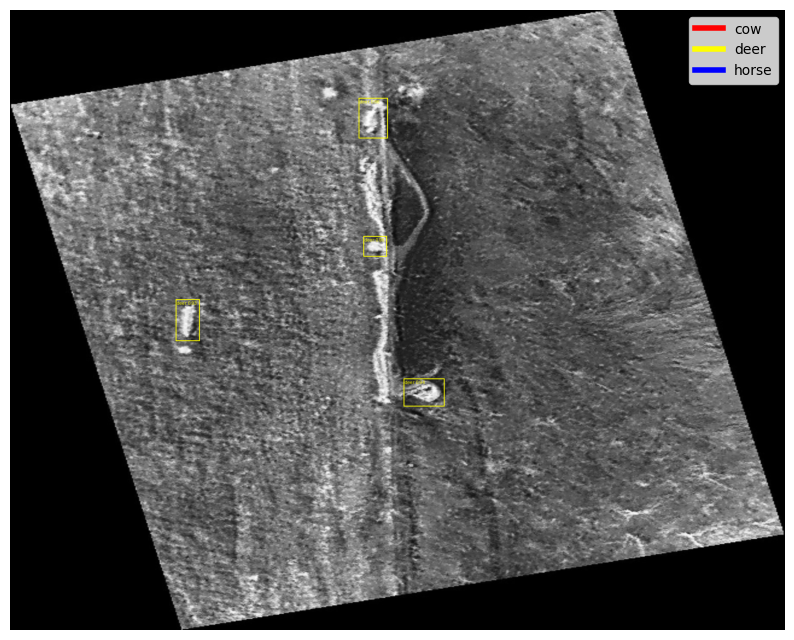

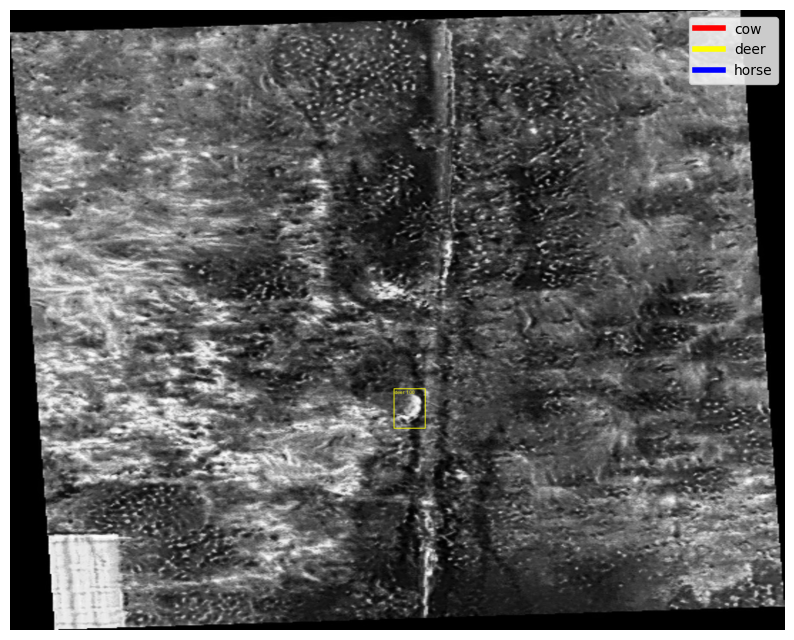

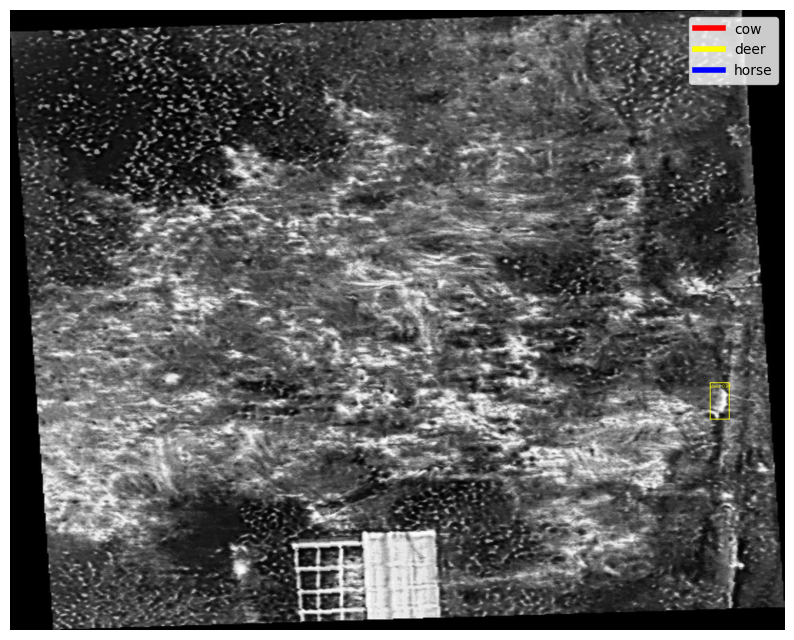

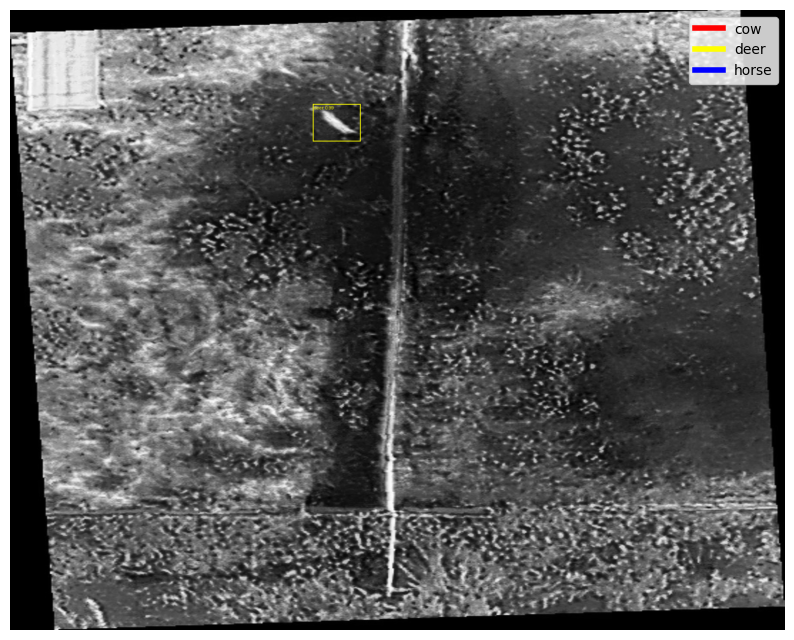

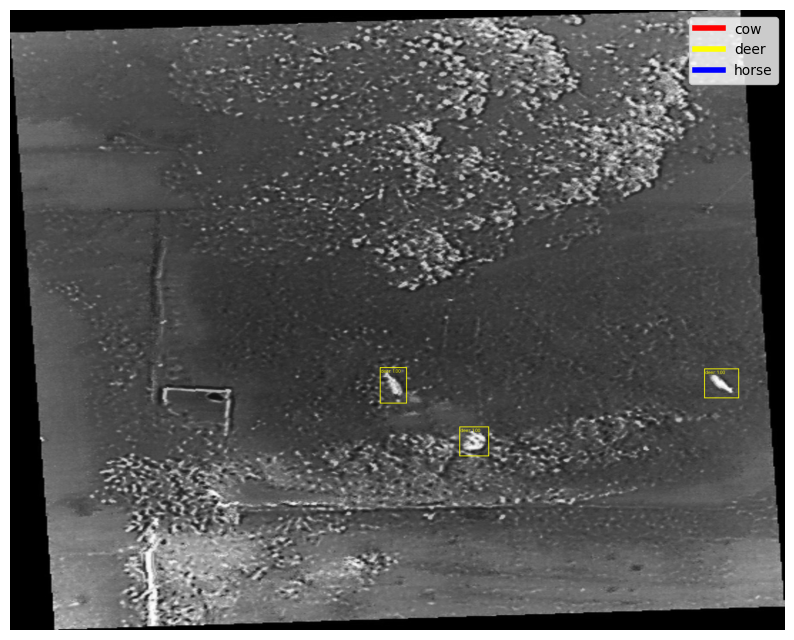

...

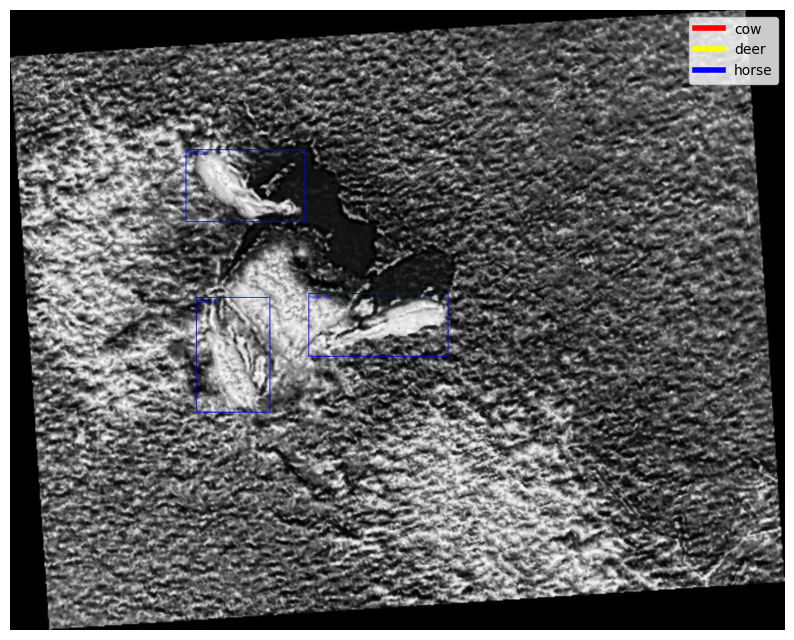

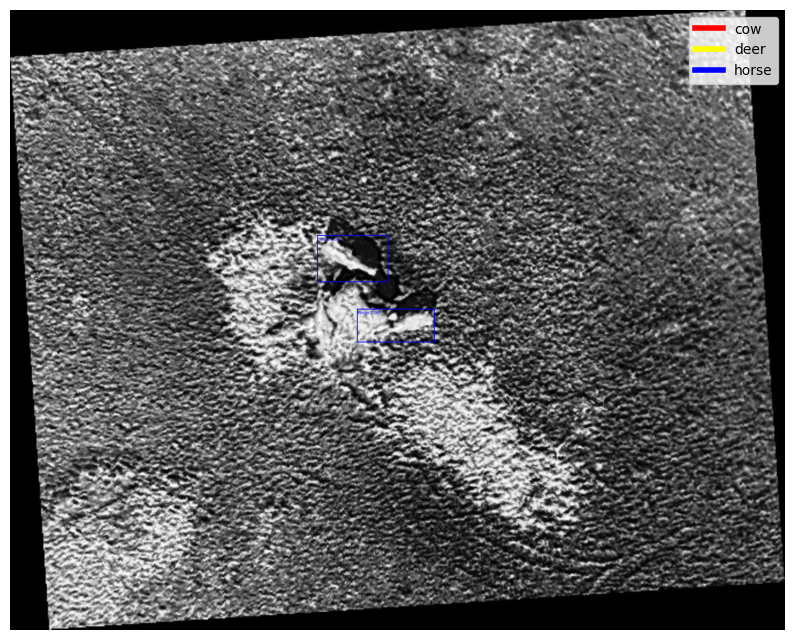

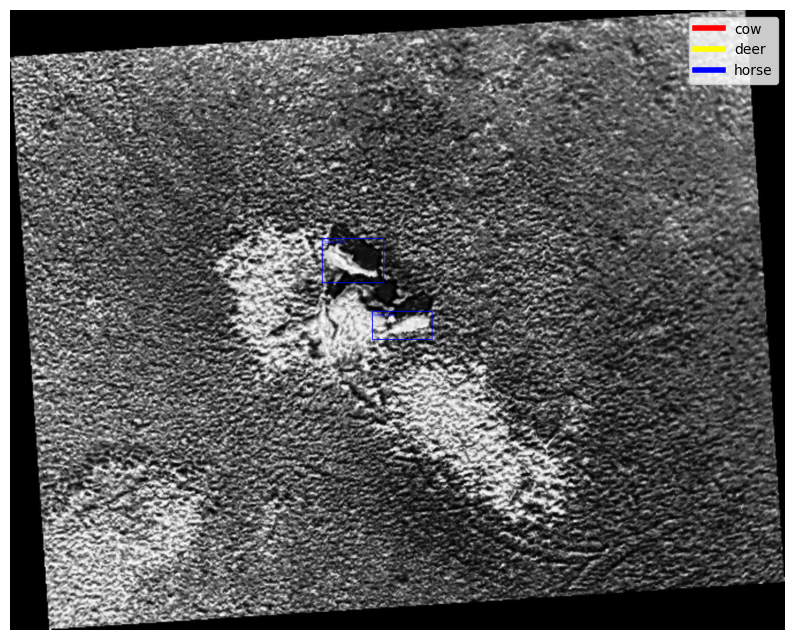

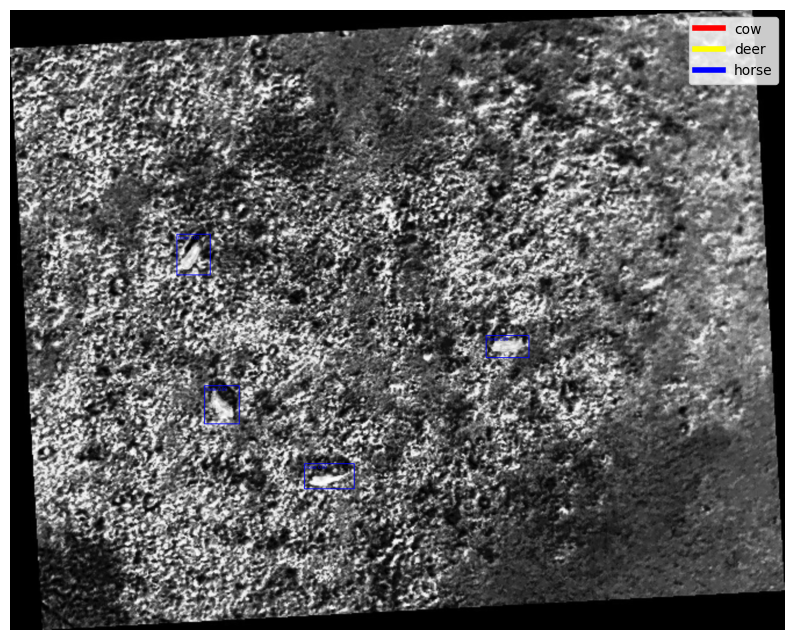

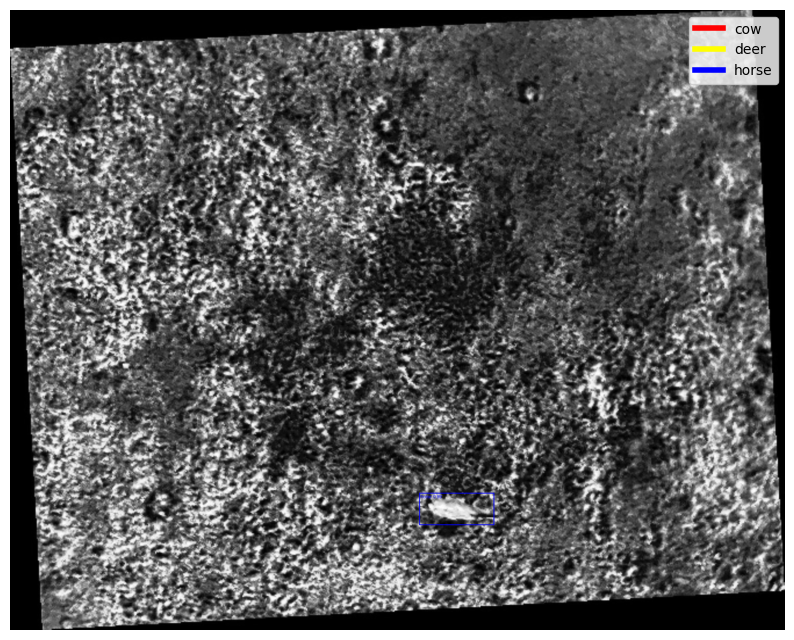

In [6]:
label_map = {
    1: "cow",
    2: "deer",
    3: "horse"
}

for idx in range(len(test_ds)):
    fast_rcnn.show_predictions(test_ds,idx,label_map)
